In [4]:
import wfdb
import numpy as np
import os
import pandas as pd
import math
import h5py
import matplotlib.pyplot as plt

In [5]:
def print_object_attributes(obj): #https://stackoverflow.com/questions/192109/is-there-a-built-in-function-to-print-all-the-current-properties-and-values-of-a
    for attr in dir(obj):
        print("obj.%s = %r" % (attr, getattr(obj, attr)))

### Read MIT format .dat ecg data files and .hea headers

In [8]:
#Download first at: https://physionet.org/content/ptbdb/1.0.0/
#BASE_DIR = '/media/julian/Volume/data/ECG/mit-bih-arrhythmia-database-1.0.0/' #Arrhythmia
BASE_DIR = '/media/julian/Volume/data/ECG/ptb-diagnostic-ecg-database-1.0.0/'
def get_file_list(BASE_DIR, relative=True):
    record_files = []
    #file_endings = ['.dat', '.hea', '.xyz']
    with open(os.path.join(BASE_DIR, 'RECORDS')) as recs:
        record_files = recs.read().splitlines()
    if not relative:
        record_files = [os.path.join(BASE_DIR, f) for f in record_files]
    return record_files
record_files = get_file_list(BASE_DIR)
print(len(record_files))
print(record_files[:10])

549
['patient001/s0010_re', 'patient001/s0014lre', 'patient001/s0016lre', 'patient002/s0015lre', 'patient003/s0017lre', 'patient004/s0020are', 'patient004/s0020bre', 'patient005/s0021are', 'patient005/s0021bre', 'patient005/s0025lre']


### Extract signal from *.dat files & Read annotations & Read comments

In [9]:
def plot_cov(co, title=None):
    if title:
        plt.title(title)
    plt.imshow(co)
    plt.colorbar()
    plt.show()

In [10]:
def read_comment_map_PTB(record_path):
    #print(record_path)
    record = wfdb.rdrecord(record_path)
    comment_map = {}
    for c in record.comments:
        e = c.split(':')
        comment_map[e[0]] = e[1].strip()
    return comment_map

In [11]:
def filter_comment(comment, key):
    c = comment
    if key == 'Reason for admission':
        if 'Cardiomyopathy' in c or 'Heart failure' in c:
            return 'Cardiomyopathy'
        elif 'n/a' in k or 'Palpitation' in k:
            return 'Miscellaneous'
        elif 'angina' in k:
            new_comments['Angina'] = comments[k]
        else:
            new_comments[k] = comments[k]

In [12]:
def read_comment(record_path):
    record = wfdb.rdrecord(record_path)
    return record.comments

In [13]:
def read_header(record_path):
    record = wfdb.rdheader(record_path, rd_segments=True)
    return record.comments

In [14]:
def read_signal(record_path, physical=True):
    #print(record_path)
    record = wfdb.rdrecord(record_path, physical=physical)
    #print_object_attributes(record)
    if physical:
        data = record.p_signal
    else:
        data = record.d_signal
    return data

In [15]:
def read_annotation(record_path, physical=True):
    try:
        annotation = wfdb.rdann(record_path, 'hea', return_label_elements=['symbol', 'label_store', 'description'])
        #print(record_path)
        #print('sample:', annotation.sample, 'symbol', annotation.symbol, 'contained labels', annotation.description)
        return (annotation.sample, annotation.symbol, annotation.label_store, annotation.description)
    except ValueError as ve:
        print(record_path, ' annotation read failed:', ve)
        return None

#### Save all signals and attributes in file_data (also note how many had functioning annotations)

In [16]:
file_data = []
success = 0
for f in record_files[:]:
    p = os.path.join(BASE_DIR, f)
    d = read_signal(p, physical=False)
    file_data.append((f, d))

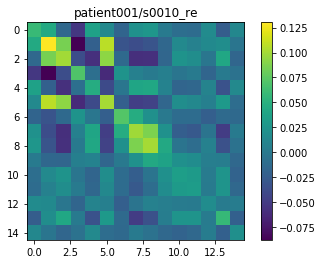

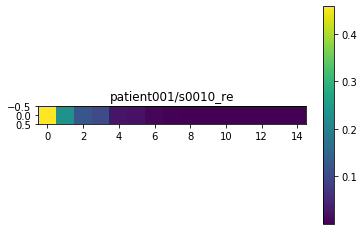

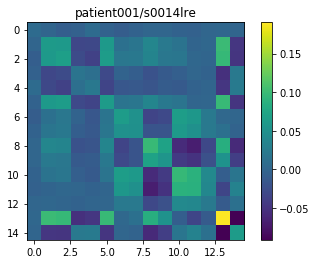

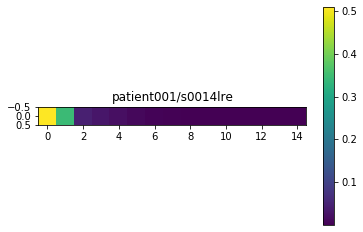

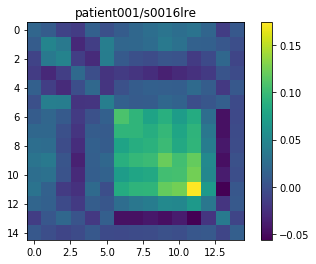

...

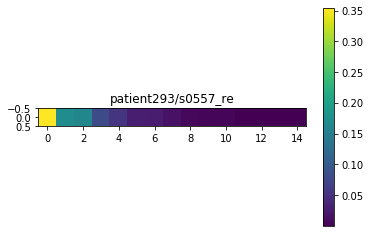

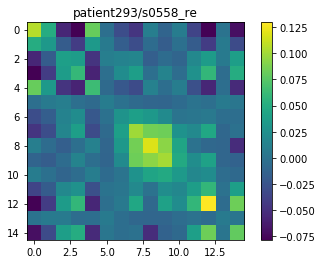

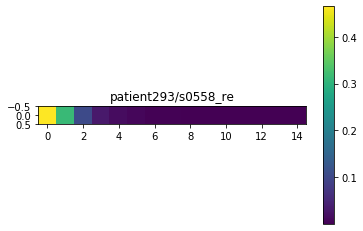

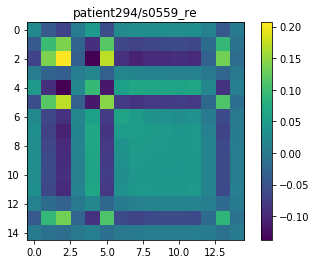

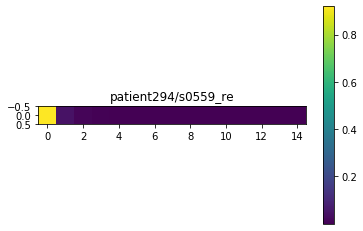

In [18]:
import numpy as np
from numpy import linalg as LA
from sklearn.preprocessing import normalize
for f in file_data:
    data = normalize(f[1], norm='l2').T
    co = np.cov(data)
    w,v = LA.eig(co)
    w = np.expand_dims(w, 0)
    plot_cov(co, f[0])
    plot_cov(w, f[0])